In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [2]:
df = pd.read_csv("train.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
pd.options.display.max_columns = None
pd.set_option('display.max_rows',None)
df.count()

Id               1460
MSSubClass       1460
MSZoning         1460
LotFrontage      1201
LotArea          1460
Street           1460
Alley              91
LotShape         1460
LandContour      1460
Utilities        1460
LotConfig        1460
LandSlope        1460
Neighborhood     1460
Condition1       1460
Condition2       1460
BldgType         1460
HouseStyle       1460
OverallQual      1460
OverallCond      1460
YearBuilt        1460
YearRemodAdd     1460
RoofStyle        1460
RoofMatl         1460
Exterior1st      1460
Exterior2nd      1460
MasVnrType       1452
MasVnrArea       1452
ExterQual        1460
ExterCond        1460
Foundation       1460
BsmtQual         1423
BsmtCond         1423
BsmtExposure     1422
BsmtFinType1     1423
BsmtFinSF1       1460
BsmtFinType2     1422
BsmtFinSF2       1460
BsmtUnfSF        1460
TotalBsmtSF      1460
Heating          1460
HeatingQC        1460
CentralAir       1460
Electrical       1459
1stFlrSF         1460
2ndFlrSF         1460
LowQualFin

In [5]:
df.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [6]:
#Dropping unnecessary columns
df = df.drop(['Alley', 'PoolQC', 'Fence', 'MiscFeature', 'FireplaceQu', 'Id'], axis = 1)

In [7]:
df.isna().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [8]:
df.SalePrice.mean()

180921.19589041095

In [9]:
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [ ]:
#Checking if the columns is important for our target column 'SalePrice', if the correlation is not enough, dropping them

In [10]:
df.Utilities.value_counts()

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

In [11]:
df.iloc(['Utilities'] == "NoSeWa")[0]

MSSubClass            60
MSZoning              RL
LotFrontage         65.0
LotArea             8450
Street              Pave
LotShape             Reg
LandContour          Lvl
Utilities         AllPub
LotConfig         Inside
LandSlope            Gtl
Neighborhood     CollgCr
Condition1          Norm
Condition2          Norm
BldgType            1Fam
HouseStyle        2Story
OverallQual            7
OverallCond            5
YearBuilt           2003
YearRemodAdd        2003
RoofStyle          Gable
RoofMatl         CompShg
Exterior1st      VinylSd
Exterior2nd      VinylSd
MasVnrType       BrkFace
MasVnrArea         196.0
ExterQual             Gd
ExterCond             TA
Foundation         PConc
BsmtQual              Gd
BsmtCond              TA
BsmtExposure          No
BsmtFinType1         GLQ
BsmtFinSF1           706
BsmtFinType2         Unf
BsmtFinSF2             0
BsmtUnfSF            150
TotalBsmtSF          856
Heating             GasA
HeatingQC             Ex
CentralAir             Y


In [12]:
df = df.drop('Utilities', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,Pave,IR1,Lvl,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,Reg,Lvl,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,Reg,Lvl,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [13]:
df.Street.value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [14]:
print(df.loc[df['Street'].isin(['Grvl']), ['SalePrice']])

      SalePrice
52       110000
335      228950
582      118500
812       55993
1061      81000
1184     186700


In [15]:
df = df.drop('Street', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Lvl,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Lvl,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Lvl,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Lvl,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Lvl,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [16]:
df = df.drop('LandContour', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [17]:
df.Condition2.value_counts()

Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: Condition2, dtype: int64

In [18]:
print(df.loc[df['Condition2'].isin(['Feedr']), ['SalePrice']])

     SalePrice
63      140000
88       85000
184     127000
531     128000
589      79500
974     167500


In [19]:
df = df.drop('Condition2', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [20]:
df.RoofMatl.value_counts()

CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Metal         1
Membran       1
Roll          1
ClyTile       1
Name: RoofMatl, dtype: int64

In [21]:
print(df.loc[df['RoofMatl'].isin(['Tar&Grv']), ['SalePrice']])

      SalePrice
367      165000
457      256000
466      167000
588      143000
666      129000
828      185000
888      268000
934      242000
954      127500
1000      82000
1423     274970


In [22]:
df = df.drop('RoofMatl', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [23]:
df.BsmtFinSF2.value_counts()

0       1293
180        5
374        3
551        2
147        2
294        2
391        2
539        2
96         2
480        2
182        2
468        2
117        2
64         2
290        2
469        2
279        2
287        2
93         2
712        2
41         2
149        1
1061       1
466        1
396        1
354        1
215        1
841        1
273        1
465        1
400        1
682        1
557        1
230        1
193        1
411        1
634        1
324        1
486        1
500        1
823        1
435        1
1085       1
345        1
764        1
377        1
128        1
630        1
127        1
106        1
791        1
240        1
276        1
163        1
627        1
110        1
872        1
352        1
334        1
546        1
420        1
105        1
972        1
173        1
68         1
661        1
608        1
547        1
906        1
81         1
144        1
375        1
438        1
1031       1
168        1
211        1
492        1

In [24]:
print(df.loc[df['BsmtFinSF2'].isin([180]), ['SalePrice']])

     SalePrice
223      97000
373     123000
510     164900
661     402000
663     137500


In [25]:
df = df.drop('BsmtFinSF2', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [26]:
df.LowQualFinSF.value_counts()

0      1434
80        3
360       2
205       1
479       1
397       1
514       1
120       1
481       1
232       1
53        1
515       1
156       1
473       1
420       1
390       1
371       1
392       1
144       1
572       1
528       1
234       1
513       1
384       1
Name: LowQualFinSF, dtype: int64

In [27]:
df = df.drop('LowQualFinSF', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [28]:
df.Functional.value_counts()

Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64

In [29]:
print(df.loc[df['Functional'].isin(['Maj1']), ['SalePrice']])

      SalePrice
145      130000
190      315000
193      130000
375       61000
529      200624
542      213250
636       60000
1040     155000
1068     151400
1088     137500
1139     144000
1173     200500
1229     127000
1304     130000


In [30]:
df = df.drop('Functional', axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [31]:
df.GarageQual.value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [32]:
print(df.loc[df['GarageQual'].isin(['Gd']), ['SalePrice']])

      SalePrice
9        118000
172      239000
290      233230
438       90350
568      316600
583      325000
841      157500
842      174900
1159     185000
1281     180000
1312     302000
1346     262500
1393     163000
1423     274970


In [33]:
df = df.drop(['GarageQual', 'GarageCond', 'GarageYrBlt'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [34]:
df.LandSlope.value_counts()

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

In [35]:
print(df.loc[df['LandSlope'].isin(['Mod']), ['SalePrice']])

      SalePrice
52       110000
54       130000
114      259500
190      315000
208      277000
251      235000
267      179500
318      260000
351      190000
384      240000
422      113000
426      275000
451      280000
457      256000
463      188700
464      124000
476      208900
533       39300
557      108000
561      170000
568      316600
606      152000
607      225000
608      359100
617      105500
657      149000
668      168000
692      335000
711      102776
720      275000
769      538000
800      200000
812       55993
821       93000
856      147000
876      132250
888      268000
908      131000
911      143500
934      242000
953      172000
978      110000
992      187000
995      121600
1053     144500
1059     220000
1065     328000
1067     167900
1120     118400
1138     196000
1181     392500
1184     186700
1186      95000
1190     168000
1211     164000
1244     230000
1268     381000
1287     190000
1326      79000
1332     100000
1337      52500
1361    

In [36]:
df = df.drop(['LandSlope'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [37]:
df.ExterCond.value_counts()

TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64

In [38]:
print(df.loc[df['ExterCond'].isin(['Fa']), ['SalePrice']])

      SalePrice
30        40000
88        85000
102      118964
104      169500
125       84500
142      166000
246      137000
291      135900
307       89500
341       82000
375       61000
386       81000
398       67000
410       60000
488      160000
533       39300
609      118500
636       60000
657      149000
694      141500
705       55000
969      140000
1009     102000
1048     115000
1139     144000
1144      80000
1285     132500
1380      58500


In [39]:
df = df.drop(['ExterCond'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,No,GLQ,732,Unf,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,Av,GLQ,1369,Unf,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,No,Unf,0,Unf,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,No,GLQ,851,Unf,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [40]:
df.BsmtFinType2.value_counts()

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [41]:
print(df.loc[df['BsmtFinType2'].isin(['LwQ']), ['SalePrice']])

      SalePrice
42       144000
114      259500
174      184000
197      235000
201      171500
223       97000
265      175500
273      139000
372      125000
373      123000
493      155000
499      120000
512      129900
543      133000
545      229000
561      170000
598      217500
627      153000
633      139400
645      143250
685      207500
695      176000
754      156000
785      161500
810      181000
856      147000
905      128000
924      207500
925      175000
940      150900
953      172000
1007      88000
1024     287000
1059     220000
1067     167900
1101     119500
1215     125000
1220     115000
1221     134000
1242     170000
1259     151000
1272     137000
1315     206900
1386     250000
1387     136000
1459     147500


In [42]:
df = df.drop(['BsmtFinType2'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,No,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,Gd,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,Mn,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,No,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,Av,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,No,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,Av,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,Mn,ALQ,859,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,No,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,No,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [43]:
df.SaleType.value_counts()

WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64

In [44]:
print(df.loc[df['SaleType'].isin(['ConLD']), ['SalePrice']])

      SalePrice
88        85000
362      198500
431       79900
488      160000
811      144500
969      140000
985      125000
1061      81000
1158     235128


In [45]:
df = df.drop(['SaleType'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,No,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,Gd,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,Mn,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,No,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,Av,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,No,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,Av,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,Mn,ALQ,859,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,No,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,No,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000


In [46]:
df.RoofStyle.value_counts()

Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64

In [47]:
print(df.loc[df['RoofStyle'].isin(['Gambrel']), ['SalePrice']])

      SalePrice
30        40000
74       107400
114      259500
386       81000
508      161000
519      234000
574      139000
671      103600
1192     125000
1263     180500
1414     207000


In [48]:
df = df.drop(['RoofStyle'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,No,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500
1,20,RL,80.0,9600,Reg,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,Gd,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500
2,60,RL,68.0,11250,IR1,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,Mn,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500
3,70,RL,60.0,9550,IR1,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,No,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000
4,60,RL,84.0,14260,IR1,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,Av,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000
5,50,RL,85.0,14115,IR1,Inside,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,No,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000
6,20,RL,75.0,10084,Reg,Inside,Somerst,Norm,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,Av,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000
7,60,RL,NaN,10382,IR1,Corner,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,Mn,ALQ,859,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,Normal,200000
8,50,RM,51.0,6120,Reg,Inside,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,No,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900
9,190,RL,50.0,7420,Reg,Corner,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,No,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000


In [49]:
df.LotConfig.value_counts()

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [50]:
print(df.loc[df['LotConfig'].isin(['CulDSac']), ['SalePrice']])

      SalePrice
16       149000
28       207500
31       149350
42       144000
43       130250
46       239686
58       438780
120      180000
124      181000
147      222500
152      190000
160      162500
178      501837
186      173000
191      184000
206      143900
213      156000
237      194500
249      277000
271      241500
272      290000
295      142500
326      324000
346      151500
359      280000
360      156000
376      148000
388      191000
391      215000
414      228000
435      212000
457      256000
518      211000
529      200624
536      188000
564      268000
580      181900
660      197900
661      402000
664      423000
684      221000
685      207500
706      302000
714      130500
720      275000
737      239900
757      158900
764      270000
769      538000
770      134900
792      269790
815      224900
817      271000
820      183000
828      185000
832      237000
845      171000
847      133500
879      136500
881      187500
885      328900
903     

In [51]:
df = df.drop(['LotConfig'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,No,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500
1,20,RL,80.0,9600,Reg,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,Gd,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500
2,60,RL,68.0,11250,IR1,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,Mn,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500
3,70,RL,60.0,9550,IR1,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,No,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000
4,60,RL,84.0,14260,IR1,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,Av,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000
5,50,RL,85.0,14115,IR1,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,No,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000
6,20,RL,75.0,10084,Reg,Somerst,Norm,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,Av,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000
7,60,RL,NaN,10382,IR1,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,Mn,ALQ,859,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,Normal,200000
8,50,RM,51.0,6120,Reg,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,No,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900
9,190,RL,50.0,7420,Reg,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,No,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000


In [52]:
df.BsmtExposure.value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [53]:
print(df.loc[df['BsmtExposure'].isin(['Mn']), ['SalePrice']])

      SalePrice
2        223500
7        200000
24       154000
26       134800
62       202500
93       133900
100      205000
113      217000
118      320000
138      230000
159      320000
162      220000
164      152000
185      475000
211      186000
216      210000
220      204900
270      266000
300      157000
312      119900
329       78000
338      202500
346      151500
352       95000
364      190000
411      145000
429      175000
439      110000
490      115000
518      211000
528       86000
531      128000
563      185000
586      130000
598      217500
602      220000
604      221000
608      359100
609      118500
610      313000
631      209500
644      370878
647      155000
651      108000
664      423000
678      372500
682      173000
685      207500
697      123500
699      196000
711      102776
712      189000
735      163000
741      142000
753      275500
757      158900
761      100000
762      215200
763      337000
767      160000
819      224000
844     

In [54]:
df = df.drop(['BsmtExposure'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500
1,20,RL,80.0,9600,Reg,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500
2,60,RL,68.0,11250,IR1,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500
3,70,RL,60.0,9550,IR1,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000
4,60,RL,84.0,14260,IR1,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000
5,50,RL,85.0,14115,IR1,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000
6,20,RL,75.0,10084,Reg,Somerst,Norm,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000
7,60,RL,NaN,10382,IR1,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,HdBoard,HdBoard,Stone,240.0,TA,CBlock,Gd,TA,ALQ,859,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,2,Attchd,RFn,2,484,Y,235,204,228,0,0,0,350,11,2009,Normal,200000
8,50,RM,51.0,6120,Reg,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900
9,190,RL,50.0,7420,Reg,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000


In [55]:
df.SaleCondition.value_counts()

Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64

In [56]:
print(df.loc[df['SaleCondition'].isin(['Family']), ['SalePrice']])

      SalePrice
137      171000
154      125000
217      107000
251      235000
299      158500
454      188000
628      135000
632       82500
655       88000
734      108000
804      118000
822      225000
858      152000
886      145000
1102     135000
1127     259000
1145     149000
1242     170000
1387     136000
1404     105000


In [57]:
df = df.dropna()

In [58]:
df.Neighborhood.value_counts()

NAmes      173
CollgCr    123
OldTown     96
Somerst     75
NridgHt     75
Edwards     65
Gilbert     49
NWAmes      45
Sawyer      44
SawyerW     44
BrkSide     42
Crawfor     41
NoRidge     33
Mitchel     30
Timber      29
IDOTRR      27
StoneBr     20
SWISU       19
BrDale      15
Blmngtn     14
ClearCr     11
MeadowV     10
Veenker      7
NPkVill      7
Blueste      2
Name: Neighborhood, dtype: int64

In [59]:
print(df.loc[df['Neighborhood'].isin(['MeadowV']), ['SalePrice']])

      SalePrice
23       129900
75        91000
344       85000
357      134000
489       86000
915       75000
1007      88000
1039      80000
1068     151400
1367     127000


In [ ]:
#Categorizing columns with string values using 'get_dummies'

In [60]:
df = df.join(pd.get_dummies(df.Neighborhood)).drop(['Neighborhood'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
0,60,RL,65.0,8450,Reg,Norm,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,Feedr,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,IR1,Norm,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Norm,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,Norm,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,50,RL,85.0,14115,IR1,Norm,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,20,RL,75.0,10084,Reg,Norm,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8,50,RM,51.0,6120,Reg,Artery,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,190,RL,50.0,7420,Reg,Artery,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,20,RL,70.0,11200,Reg,Norm,1Fam,1Story,5,5,1965,1965,HdBoard,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [61]:
df.LotShape.value_counts()

Reg    760
IR1    303
IR2     26
IR3      7
Name: LotShape, dtype: int64

In [62]:
print(df.loc[df['LotShape'].isin(['IR3']), ['SalePrice']])

      SalePrice
264       73000
301      267000
313      375000
1107     274725
1127     259000
1298     160000
1430     192140


In [63]:
df = df.drop(['LotShape'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
0,60,RL,65.0,8450,Norm,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Feedr,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,Norm,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,Norm,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,Norm,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,50,RL,85.0,14115,Norm,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,20,RL,75.0,10084,Norm,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8,50,RM,51.0,6120,Artery,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,190,RL,50.0,7420,Artery,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,20,RL,70.0,11200,Norm,1Fam,1Story,5,5,1965,1965,HdBoard,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [64]:
df.Condition1.value_counts()

Norm      952
Feedr      52
Artery     42
RRAn       24
PosN        9
RRAe        8
RRNn        4
PosA        4
RRNe        1
Name: Condition1, dtype: int64

In [65]:
df = df.drop(['Condition1'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
0,60,RL,65.0,8450,1Fam,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,1Fam,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,1Fam,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,1Fam,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,1Fam,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,50,RL,85.0,14115,1Fam,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,20,RL,75.0,10084,1Fam,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8,50,RM,51.0,6120,1Fam,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,190,RL,50.0,7420,2fmCon,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,20,RL,70.0,11200,1Fam,1Story,5,5,1965,1965,HdBoard,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [66]:
df.BldgType.value_counts()

1Fam      927
TwnhsE     90
Twnhs      35
Duplex     24
2fmCon     20
Name: BldgType, dtype: int64

In [67]:
print(df.loc[df['BldgType'].isin(['TwnhsE']), ['SalePrice']])

      SalePrice
23       129900
34       277500
45       319900
62       202500
81       153500
87       164500
115      176000
123      153900
172      239000
189      286000
219      167240
229      192500
235       89500
243      120000
251      235000
284      179200
285      164700
326      324000
333      207000
343      266000
344       85000
350      318061
357      134000
372      125000
385      192000
400      245500
432      122500
443      172500
472      148000
474      251000
504      147000
511      202665
543      133000
550      140000
578      146000
597      194201
603      151000
639      264561
640      274000
680      143000
689      194700
699      196000
707      254000
712      189000
730      236500
744      180000
755      172500
764      270000
775      162000
790      160200
819      224000
831      151000
850      131500
885      328900
914      173733
923      193000
956      124000
962      155000
972       99500
1004     181000
1007      88000
1019    

In [68]:
df = df.drop(['BldgType'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
0,60,RL,65.0,8450,2Story,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,1Story,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,2Story,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,2Story,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,2Story,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,50,RL,85.0,14115,1.5Fin,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,20,RL,75.0,10084,1Story,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8,50,RM,51.0,6120,1.5Fin,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,190,RL,50.0,7420,1.5Unf,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,20,RL,70.0,11200,1Story,5,5,1965,1965,HdBoard,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [69]:
df.HouseStyle.value_counts()

1Story    541
2Story    347
1.5Fin    117
SLvl       43
SFoyer     23
1.5Unf     10
2.5Unf      9
2.5Fin      6
Name: HouseStyle, dtype: int64

In [70]:
print(df.loc[df['HouseStyle'].isin(['1.5Fin']), ['SalePrice']])

      SalePrice
5        143000
8        129900
46       239686
51       114500
69       225000
77       127000
110      136900
121      100000
142      166000
183      200000
184      127000
187      135000
202      112000
204      110000
239      113000
242       79000
263      130000
275      205000
286      159000
292      131000
296      152000
312      119900
345      140200
352       95000
354      140000
380      127000
390      119000
394      109000
406      115000
418      126000
436      116000
439      110000
442      162900
448      119500
449      120000
488      160000
491      133000
497      184000
522      159000
546      210000
557      108000
563      185000
568      316600
575      118500
576      145000
579      131500
584      133000
601      141000
637       93000
653      135000
658       97500
681      159434
694      141500
711      102776
723      135000
729      103000
767      160000
786      139000
799      175000
814      116000
823      139500
839     

In [71]:
df = df.drop(['HouseStyle'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
0,60,RL,65.0,8450,7,5,2003,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,6,8,1976,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,7,5,2001,2002,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,7,5,1915,1970,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,8,5,2000,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,50,RL,85.0,14115,5,5,1993,1995,VinylSd,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,20,RL,75.0,10084,8,5,2004,2005,VinylSd,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8,50,RM,51.0,6120,7,5,1931,1950,BrkFace,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,190,RL,50.0,7420,5,6,1939,1950,MetalSd,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,20,RL,70.0,11200,5,5,1965,1965,HdBoard,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [72]:
df.Exterior1st.value_counts()

VinylSd    423
MetalSd    172
HdBoard    151
Wd Sdng    149
Plywood     64
CemntBd     45
BrkFace     36
WdShing     20
Stucco      18
AsbShng     14
BrkComm      1
Stone        1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64

In [73]:
print(df.loc[df['Exterior1st'].isin(['Stone']), ['SalePrice']])

      SalePrice
1152     230000


In [74]:
df = pd.get_dummies(df, columns=['Exterior1st'])
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing
0,60,RL,65.0,8450,7,5,2003,2003,VinylSd,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,6,8,1976,1976,MetalSd,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,60,RL,68.0,11250,7,5,2001,2002,VinylSd,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,7,5,1915,1970,Wd Shng,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,8,5,2000,2000,VinylSd,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,50,RL,85.0,14115,5,5,1993,1995,VinylSd,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,20,RL,75.0,10084,8,5,2004,2005,VinylSd,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,50,RM,51.0,6120,7,5,1931,1950,Wd Shng,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
9,190,RL,50.0,7420,5,6,1939,1950,MetalSd,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
10,20,RL,70.0,11200,5,5,1965,1965,HdBoard,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [75]:
df.Exterior2nd.value_counts()

VinylSd    414
MetalSd    169
Wd Sdng    145
HdBoard    138
Plywood     82
CmentBd     45
Wd Shng     28
Stucco      20
BrkFace     19
AsbShng     15
ImStucc      9
Brk Cmn      6
AsphShn      2
Stone        2
Other        1
CBlock       1
Name: Exterior2nd, dtype: int64

In [76]:
print(df.loc[df['Exterior2nd'].isin(['Stone']), ['SalePrice']])

      SalePrice
1152     230000
1343     177000


In [77]:
df = df.drop(['Exterior2nd'], axis = 1)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing
0,60,RL,65.0,8450,7,5,2003,2003,BrkFace,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,6,8,1976,1976,None,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,60,RL,68.0,11250,7,5,2001,2002,BrkFace,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,7,5,1915,1970,None,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,8,5,2000,2000,BrkFace,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,50,RL,85.0,14115,5,5,1993,1995,None,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,20,RL,75.0,10084,8,5,2004,2005,Stone,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,50,RM,51.0,6120,7,5,1931,1950,None,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
9,190,RL,50.0,7420,5,6,1939,1950,None,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
10,20,RL,70.0,11200,5,5,1965,1965,None,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [78]:
df.MasVnrType.value_counts()

None       639
BrkFace    329
Stone      119
BrkCmn       9
Name: MasVnrType, dtype: int64

In [79]:
print(df.loc[df['MasVnrType'].isin(['Stone']), ['SalePrice']])

      SalePrice
6        307000
11       345000
13       279500
25       256300
27       306000
35       309000
62       202500
82       245000
87       164500
112      383970
145      130000
151      372402
167      325624
171      215000
174      184000
178      501837
188      153337
193      130000
196      311872
209      145000
240      262500
251      235000
257      220000
261      276000
281      185000
282      207500
283      244600
294      167000
305      305900
320      342643
333      207000
336      377426
348      154000
378      394432
389      426000
399      241000
409      339750
440      555000
460      263435
467      146500
468      250000
478      297000
511      202665
523      184750
527      446261
552      255500
591      451950
619      305000
631      209500
644      370878
647      155000
678      372500
683      285000
689      194700
724      320000
727      194500
765      264132
793      225000
798      485000
803      582933
805      227680
819     

In [80]:
df = pd.get_dummies(df, columns=['MasVnrType'])
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
0,60,RL,65.0,8450,7,5,2003,2003,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,20,RL,80.0,9600,6,8,1976,1976,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,7,5,2001,2002,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
3,70,RL,60.0,9550,7,5,1915,1970,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,60,RL,84.0,14260,8,5,2000,2000,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
5,50,RL,85.0,14115,5,5,1993,1995,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
6,20,RL,75.0,10084,8,5,2004,2005,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
8,50,RM,51.0,6120,7,5,1931,1950,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9,190,RL,50.0,7420,5,6,1939,1950,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
10,20,RL,70.0,11200,5,5,1965,1965,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


In [81]:
df.MSZoning.value_counts()

RL         852
RM         173
FV          54
RH           9
C (all)      8
Name: MSZoning, dtype: int64

In [82]:
print(df.loc[df['MSZoning'].isin(['FV']), ['SalePrice']])

      SalePrice
47       249700
56       172500
87       164500
105      250000
115      176000
158      254900
212      252678
240      262500
256      207500
270      266000
281      185000
285      164700
297      239000
317      270000
377      340000
381      187750
399      241000
409      339750
453      210000
460      263435
501      226700
507      208300
525      176000
549      263000
578      146000
603      151000
644      370878
686      227875
699      196000
755      172500
758      179400
762      215200
824      232600
829      147400
831      151000
864      250580
875      303477
885      328900
914      173733
959      155000
989      197000
1087     252000
1089     197000
1091     160000
1172     171900
1191     174000
1217     229456
1246     186500
1265     183900
1317     208900
1364     144152
1374     250000
1442     310000
1454     185000


In [83]:
df = pd.get_dummies(df, columns=['MSZoning'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,60,65.0,8450,7,5,2003,2003,196.0,Gd,PConc,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,TA,CBlock,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,Gd,PConc,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,TA,BrkTil,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,60,84.0,14260,8,5,2000,2000,350.0,Gd,PConc,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,TA,Wood,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
6,20,75.0,10084,8,5,2004,2005,186.0,Gd,PConc,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,TA,BrkTil,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,TA,BrkTil,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
10,20,70.0,11200,5,5,1965,1965,0.0,TA,CBlock,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [84]:
df = df.drop(['Foundation'], axis = 1)
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,60,65.0,8450,7,5,2003,2003,196.0,Gd,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,TA,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,Gd,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,TA,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,60,84.0,14260,8,5,2000,2000,350.0,Gd,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,TA,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
6,20,75.0,10084,8,5,2004,2005,186.0,Gd,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,TA,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,TA,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
10,20,70.0,11200,5,5,1965,1965,0.0,TA,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [85]:
df.ExterQual.value_counts()

TA    646
Gd    397
Ex     46
Fa      7
Name: ExterQual, dtype: int64

In [86]:
print(df.loc[df['ExterQual'].isin(['Ex']), ['SalePrice']])

      SalePrice
11       345000
34       277500
45       319900
58       438780
178      501837
196      311872
224      386250
238      318000
278      415298
343      266000
349      437154
350      318061
389      426000
440      555000
477      380000
515      402861
523      184750
527      446261
540      315000
581      253293
583      325000
591      451950
618      314813
640      274000
644      370878
691      755000
702      361919
724      320000
769      538000
798      485000
803      582933
825      385000
898      611657
919      176500
932      320000
987      395192
994      337500
1058     335000
1181     392500
1228     367294
1267     378500
1298     160000
1388     377500
1437     394617
1442     310000
1457     266500


In [87]:
df = pd.get_dummies(df, columns=['ExterQual'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA
0,60,65.0,8450,7,5,2003,2003,196.0,Gd,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,Gd,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,Gd,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,TA,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,Gd,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,Gd,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,Ex,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,TA,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,TA,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
10,20,70.0,11200,5,5,1965,1965,0.0,TA,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1


In [88]:
df = pd.get_dummies(df, columns=['BsmtQual'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA
0,60,65.0,8450,7,5,2003,2003,196.0,TA,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,TA,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,TA,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,Gd,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,TA,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,TA,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0
6,20,75.0,10084,8,5,2004,2005,186.0,TA,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0
8,50,51.0,6120,7,5,1931,1950,0.0,TA,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,TA,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1
10,20,70.0,11200,5,5,1965,1965,0.0,TA,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1


In [89]:
df.BsmtCond.value_counts()

TA    1008
Gd      51
Fa      36
Po       1
Name: BsmtCond, dtype: int64

In [90]:
print(df.loc[df['BsmtCond'].isin(['Po']), ['SalePrice']])

     SalePrice
398      67000


In [91]:
df = pd.get_dummies(df, columns=['BsmtCond'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA
0,60,65.0,8450,7,5,2003,2003,196.0,GLQ,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
1,20,80.0,9600,6,8,1976,1976,0.0,ALQ,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,GLQ,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,ALQ,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,GLQ,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
5,50,85.0,14115,5,5,1993,1995,0.0,GLQ,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,GLQ,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
8,50,51.0,6120,7,5,1931,1950,0.0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,GLQ,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1
10,20,70.0,11200,5,5,1965,1965,0.0,Rec,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1


In [92]:
df = df.drop(['BsmtFinType1'], axis = 1)
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1
10,20,70.0,11200,5,5,1965,1965,0.0,906,134,1040,GasA,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1


In [93]:
df = pd.get_dummies(df, columns=['Heating'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,Ex,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0
10,20,70.0,11200,5,5,1965,1965,0.0,906,134,1040,Ex,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,

In [94]:
df = pd.get_dummies(df, columns=['HeatingQC'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,Y,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0
10,20,70.0,11200,5,5,1965,1965,0.0,906,134,1040,Y,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0,2,2008,Normal,129500,0,0,0,0,0

In [95]:
df.CentralAir.value_counts()

Y    1038
N      58
Name: CentralAir, dtype: int64

In [96]:
print(df.loc[df['CentralAir'].isin(['N']), ['SalePrice']])

      SalePrice
29        68500
30        40000
52       110000
61       101000
74       107400
93       133900
98        83000
217      107000
242       79000
246      137000
264       73000
275      205000
325       87000
329       78000
352       95000
383       76000
411      145000
417      239000
418      126000
438       90350
456       98000
488      160000
514       96500
565      128000
579      131500
596      114504
671      103600
676       87000
713      129000
735      163000
747      265979
809      106000
812       55993
821       93000
870      109500
883      118500
896      106500
912       88000
913      145000
916       35311
955      145000
974      167500
985      125000
998       91000
1013      85000
1062      90000
1100      60000
1135     102000
1144      80000
1223     137900
1248     129500
1266     122000
1292     107500
1376      91000
1380      58500
1387     136000
1393     163000
1448     112000


In [97]:
df = pd.get_dummies(df, columns=['CentralAir'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,SBrkr,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1
10,20,70.0,11200,5,5,1965,1965,0.0,906,134,1040,SBrkr,1040,0,1040,1,0,1,0,3,1,TA,5,0,Detchd,Unf,1,384,Y,0,0,0,0,0,0,0

In [98]:
df.Electrical.value_counts()

SBrkr    1011
FuseA      67
FuseF      15
FuseP       2
Mix         1
Name: Electrical, dtype: int64

In [99]:
print(df.loc[df['Electrical'].isin(['FuseF']), ['SalePrice']])

      SalePrice
8        129900
21       139400
97        94750
325       87000
358      130000
418      126000
565      128000
579      131500
771      102000
955      145000
1100      60000
1235     138887
1266     122000
1285     132500
1380      58500


In [100]:
df = pd.get_dummies(df, columns=['Electrical'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,Gd,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,TA,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,Gd,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,Gd,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,Gd,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,TA,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,Gd,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,TA,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,1077,0,1077,1,0,1,0,2,2,TA,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
10,20,70.

In [101]:
df.KitchenQual.value_counts()

TA    528
Gd    456
Ex     91
Fa     21
Name: KitchenQual, dtype: int64

In [102]:
print(df.loc[df['KitchenQual'].isin(['Fa']), ['SalePrice']])

      SalePrice
29        68500
61       101000
246      137000
345      140200
491      133000
565      128000
586      130000
628      135000
669      137500
761      100000
812       55993
814      116000
867      129000
1034     119750
1100      60000
1125     115000
1132     117500
1144      80000
1147     174500
1151     149900
1345     108500


In [103]:
df = pd.get_dummies(df, columns=['KitchenQual'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,8,0,Attchd,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,Attchd,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,6,1,Attchd,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,7,1,Detchd,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,Attchd,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,5,0,Attchd,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,Attchd,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,Detchd,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,1077,0,1077,1,0,1,0,2,2,5,2,Attchd,RFn,1,205,Y,0,4,0,0,0,0,0,1,2008,Normal,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

In [104]:
df.GarageType.value_counts()

Attchd     682
Detchd     325
BuiltIn     63
Basment     15
CarPort      6
2Types       5
Name: GarageType, dtype: int64

In [105]:
print(df.loc[df['GarageType'].isin(['CarPort']), ['SalePrice']])

      SalePrice
52       110000
341       82000
510      164900
557      108000
1163     108959
1186      95000


In [106]:
df = pd.get_dummies(df, columns=['GarageType'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,8,0,RFn,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,RFn,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,6,1,RFn,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,7,1,Unf,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,RFn,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,5,0,Unf,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,RFn,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,Unf,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
9,190,50.0,7420,5,6,1939,1950,0.0,851,140,991,1077,0,1077,1,0,1,

In [107]:
df = pd.get_dummies(df, columns=['GarageFinish'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleCondition,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,8,0,2,548,Y,0,61,0,0,0,0,0,2,2008,Normal,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,2,460,Y,298,0,0,0,0,0,0,5,2007,Normal,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,6,1,2,608,Y,0,42,0,0,0,0,0,9,2008,Normal,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,7,1,3,642,Y,0,35,272,0,0,0,0,2,2006,Abnorml,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,3,836,Y,192,84,0,0,0,0,0,12,2008,Normal,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,5,0,2,480,Y,40,30,0,320,0,0,700,10,2009,Normal,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,2,636,Y,255,57,0,0,0,0,0,8,2007,Normal,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,2,468,Y,90,0,205,0,0,0,0,4,2008,Abnorml,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1
9,190,50.0

In [108]:
df.SaleCondition.value_counts()

Normal     882
Partial    119
Abnorml     70
Family      18
Alloca       6
AdjLand      1
Name: SaleCondition, dtype: int64

In [109]:
df = pd.get_dummies(df, columns=['SaleCondition'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,8,0,2,548,Y,0,61,0,0,0,0,0,2,2008,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,2,460,Y,298,0,0,0,0,0,0,5,2007,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,6,1,2,608,Y,0,42,0,0,0,0,0,9,2008,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,7,1,3,642,Y,0,35,272,0,0,0,0,2,2006,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,3,836,Y,192,84,0,0,0,0,0,12,2008,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,5,0,2,480,Y,40,30,0,320,0,0,700,10,2009,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,2,636,Y,255,57,0,0,0,0,0,8,2007,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,2,468,Y,90,0,205,0,0,0,0,4,2008,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [110]:
df = pd.get_dummies(df, columns=['PavedDrive'])
df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,PavedDrive_N,PavedDrive_P,PavedDrive_Y
0,60,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
1,20,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
2,60,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1
4,60,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
5,50,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,0,1,1,1,1,5,0,2,480,40,30,0,320,0,0,700,10,2009,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1
6,20,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,2,636,255,57,0,0,0,0,0,8,2007,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
8,50,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,2,468,90,0,205,0,0,0,0,4,2008,

In [111]:
df.count()

MSSubClass               1096
LotFrontage              1096
LotArea                  1096
OverallQual              1096
OverallCond              1096
YearBuilt                1096
YearRemodAdd             1096
MasVnrArea               1096
BsmtFinSF1               1096
BsmtUnfSF                1096
TotalBsmtSF              1096
1stFlrSF                 1096
2ndFlrSF                 1096
GrLivArea                1096
BsmtFullBath             1096
BsmtHalfBath             1096
FullBath                 1096
HalfBath                 1096
BedroomAbvGr             1096
KitchenAbvGr             1096
TotRmsAbvGrd             1096
Fireplaces               1096
GarageCars               1096
GarageArea               1096
WoodDeckSF               1096
OpenPorchSF              1096
EnclosedPorch            1096
3SsnPorch                1096
ScreenPorch              1096
PoolArea                 1096
MiscVal                  1096
MoSold                   1096
YrSold                   1096
SalePrice 

In [ ]:
#Visualizing columns and their correlations

In [112]:
plt.figure(figsize = (250, 70))
sns.heatmap(df.corr(), annot = True, cmap = "YlGnBu")

<Axes: >

In [ ]:
#Visualizing columns and their correlations with target column 'SalePrice'
plt.figure(figsize = (25, 5))
sns.heatmap(df.corr().loc[['SalePrice'],:])

In [113]:
df = df.drop(['MSSubClass', 'BsmtFullBath', 'BsmtHalfBath', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold',
              'YrSold', 'Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor', 'Gilbert', 'MeadowV', 
             'Mitchel', 'NWAmes', 'NPkVill', 'SWISU', 'Sawyer', 'Veenker', 'Exterior1st_AsbShng', 'Exterior1st_BrkComm', 
              'Exterior1st_BrkFace', 'Exterior1st_CBlock', 'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stone',
              'Exterior1st_Stucco', 'Exterior1st_WdShing', 'MasVnrType_BrkCmn', 'MSZoning_FV', 'MSZoning_RH', 'ExterQual_Fa',
              'BsmtCond_Gd', 'BsmtCond_Po', 'BsmtCond_TA', 'Heating_GasA', 'Heating_GasW', 'Heating_Grav', 'Heating_OthW',
              'HeatingQC_Po', 'Electrical_FuseP', 'Electrical_Mix', 'GarageType_2Types', 'GarageType_Basment',
              'GarageType_CarPort', 'SaleCondition_AdjLand', 'SaleCondition_Alloca', 'SaleCondition_Family',
              'PavedDrive_P', 'SawyerW'], axis = 1)
df.head(20)

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,Edwards,IDOTRR,NAmes,NoRidge,NridgHt,OldTown,Somerst,StoneBr,Timber,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_C (all),MSZoning_RL,MSZoning_RM,ExterQual_Ex,ExterQual_Gd,ExterQual_TA,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Partial,PavedDrive_N,PavedDrive_Y
0,65.0,8450,7,5,2003,2003,196.0,706,150,856,856,854,1710,2,1,3,1,8,0,2,548,0,61,0,208500,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1
1,80.0,9600,6,8,1976,1976,0.0,978,284,1262,1262,0,1262,2,0,3,1,6,1,2,460,298,0,0,181500,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1
2,68.0,11250,7,5,2001,2002,162.0,486,434,920,920,866,1786,2,1,3,1,6,1,2,608,0,42,0,223500,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1
3,60.0,9550,7,5,1915,1970,0.0,216,540,756,961,756,1717,1,0,3,1,7,1,3,642,0,35,272,140000,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1
4,84.0,14260,8,5,2000,2000,350.0,655,490,1145,1145,1053,2198,2,1,4,1,9,1,3,836,192,84,0,250000,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1
5,85.0,14115,5,5,1993,1995,0.0,732,64,796,796,566,1362,1,1,1,1,5,0,2,480,40,30,0,143000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1
6,75.0,10084,8,5,2004,2005,186.0,1369,317,1686,1694,0,1694,2,0,3,1,7,1,2,636,255,57,0,307000,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1
8,51.0,6120,7,5,1931,1950,0.0,0,952,952,1022,752,1774,2,0,2,2,8,2,2,468,90,0,205,129900,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1
9,50.0,7420,5,6,1939,1950,0.0,851,140,991,1077,0,1077,1,0,2,2,5,2,1,205,0,4,0,118000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1
10,70.0,11200,5,5,1965,1965,0.0,906,134,1040,1040,0,1040,1,0,3,1,5,0,1,384,0,0,0,129500,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1


<Axes: >

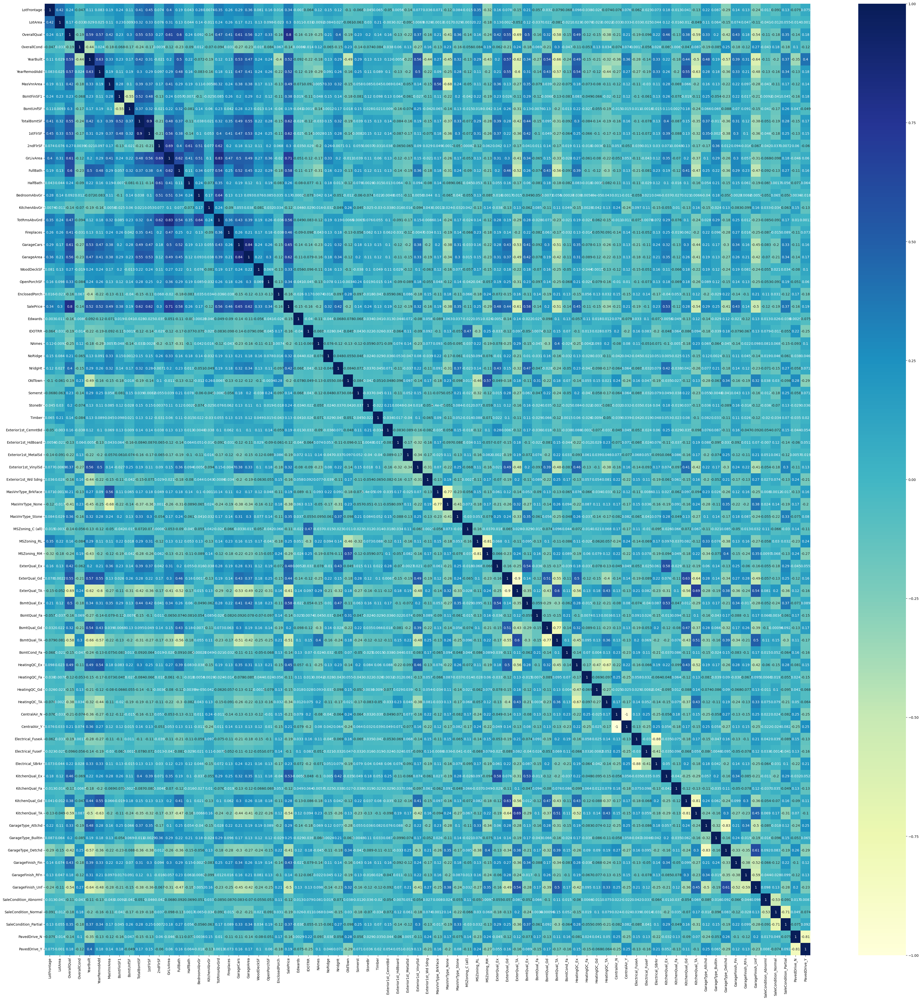

In [156]:
plt.figure(figsize = (50, 50))
sns.heatmap(df.corr(), annot = True, cmap = "YlGnBu")

<Axes: >

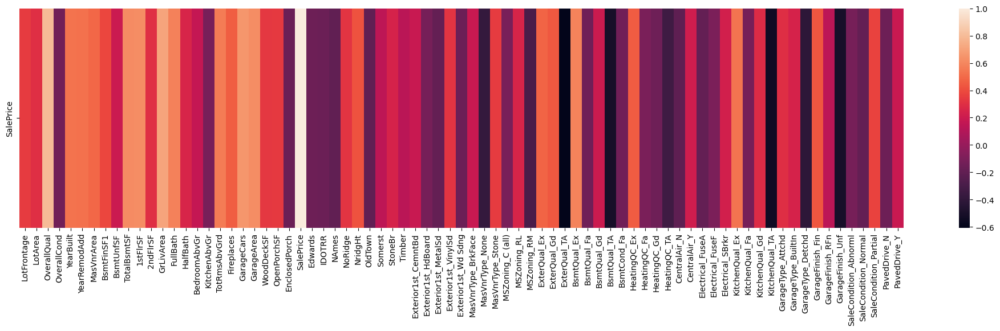

In [143]:
plt.figure(figsize = (25, 5))
sns.heatmap(df.corr().loc[['SalePrice'],:])

<Axes: xlabel='LotArea', ylabel='GarageArea'>

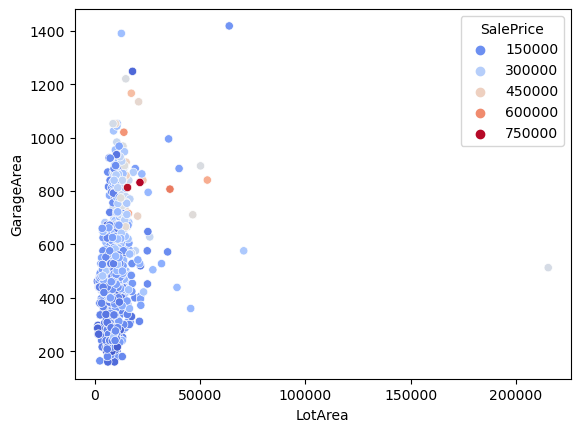

In [135]:
sns.scatterplot(x = 'LotArea', y = 'GarageArea', data = df, palette = 'coolwarm', hue = 'SalePrice')

<Axes: xlabel='LotFrontage', ylabel='YearBuilt'>

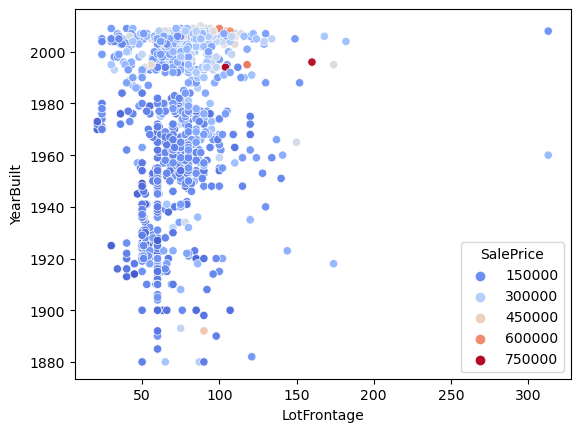

In [159]:
sns.scatterplot(x = 'LotFrontage', y = 'YearBuilt', data = df, palette = 'coolwarm', hue = 'SalePrice')

<Axes: xlabel='GrLivArea', ylabel='GarageCars'>

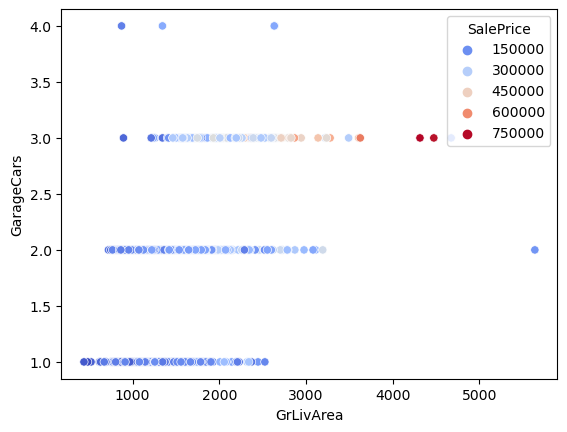

In [160]:
sns.scatterplot(x = 'GrLivArea', y = 'GarageCars', data = df, palette = 'coolwarm', hue = 'SalePrice')

In [116]:
X = df.drop(['SalePrice'], axis = 1)
y = df['SalePrice']

In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [118]:
LinearRegression_Model = LinearRegression()
LinearRegression_Model.fit(X_train, y_train)

LinearRegression()

In [119]:
LinearRegression_Model.score(X_test, y_test)

0.8592582548304015

In [120]:
RandomForestRegressor_Model = RandomForestRegressor(n_estimators = 100, random_state = 42)
RandomForestRegressor_Model.fit(X_train, y_train.ravel())

RandomForestRegressor(random_state=42)

In [121]:
RandomForestRegressor_Model.score(X_test,y_test)

0.902286100774657

In [144]:
GradientBoostingRegressor_Model = GradientBoostingRegressor(random_state=42)
GradientBoostingRegressor_Model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [145]:
GradientBoostingRegressor_Model.score(X_test,y_test)

0.9314517328928837

In [149]:
DecisionTreeRegressor_Model = DecisionTreeRegressor(max_depth = 5)
DecisionTreeRegressor_Model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [150]:
DecisionTreeRegressor_Model.score(X_test,y_test)

0.7940553334573789

In [151]:
SVR_Model = SVR(kernel = 'linear')
SVR_Model.fit(X_train, y_train)

SVR(kernel='linear')

In [152]:
SVR_Model.score(X_test,y_test)

0.8168041397065045

In [153]:
kNN_Model = KNeighborsRegressor(n_neighbors=3)
kNN_Model.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=3)

In [154]:
kNN_Model.score(X_test,y_test)

0.6637138649785259